In [1]:
!pip uninstall opencv-python -y
# downgrade OpenCV a bit since some none-free features are not avilable
!pip install opencv-contrib-python==3.4.2.17 --force-reinstall

Uninstalling opencv-python-3.4.7.28:
  Successfully uninstalled opencv-python-3.4.7.28
     |████████████████████████████████| 30.6MB 73kB/s 
     |████████████████████████████████| 20.0MB 116kB/s 
ERROR: tensor2tensor 1.14.1 requires opencv-python, which is not installed.
ERROR: stable-baselines 2.2.1 requires opencv-python, which is not installed.
ERROR: imgaug 0.2.9 requires opencv-python, which is not installed.
ERROR: gym 0.15.4 requires opencv-python, which is not installed.
ERROR: dopamine-rl 1.0.5 requires opencv-python>=3.4.1.15, which is not installed.
ERROR: albumentations 0.1.12 requires opencv-python, which is not installed.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: numpy 1.17.4
    Uninstalling numpy-1.17.4:
      Successfully uninstalled numpy-1.17.4
  Found

In [2]:
!wget https://pns2019.github.io/images/Lenna.png

--2019-11-28 13:48:28--  https://pns2019.github.io/images/Lenna.png
Resolving pns2019.github.io (pns2019.github.io)... 185.199.111.153, 185.199.109.153, 185.199.110.153, ...
Connecting to pns2019.github.io (pns2019.github.io)|185.199.111.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 473831 (463K) [image/png]
Saving to: ‘Lenna.png’

Lenna.png           100%[===================>] 462.73K  --.-KB/s    in 0.04s   

2019-11-28 13:48:28 (12.2 MB/s) - ‘Lenna.png’ saved [473831/473831]



###Setting up

In [0]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np

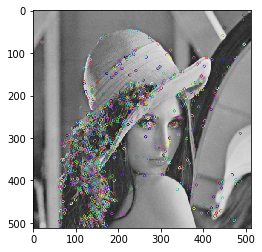

In [53]:
img = cv2.imread('Lenna.png')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

sift = cv2.xfeatures2d.SIFT_create()

kp = sift.detect(gray, None)

cv2.drawKeypoints(gray, kp, img)


plt.figure()
plt.imshow(img)
plt.show()

##Main logic

In [0]:
def display_images(img1,img2):#just for displaying
  image_1 = cv2.imread(img1)
  image_2 = cv2.imread(img2)
  cv2_imshow(image_1)
  cv2_imshow(image_2)
  return image_1,image_2

In [0]:
def SIFT(image):
  #transform imges to greyscale
  grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  ####################################################
  cv2_imshow(grey)
  #detect and describe interest points using sift and blob
  descriptor = cv2.xfeatures2d.SIFT_create()
  kps,features = descriptor.detectAndCompute(grey, None)
  #return the 2 variables
  cv2_imshow(cv2.drawKeypoints(grey,kps,None,color=(0,255,0)))
  return kps,features,grey

In [0]:
def find_hom_simple(dest_points,src_points):
  #finding homogenous function manually
  print(type(src_points))
  src_points =np.squeeze(src_points,axis = 1)
  dest_points =np.squeeze(dest_points,axis = 1) 
  A = []
  for i in range(0, len(src_points)):
      x, y = src_points[i][0], src_points[i][1]
      u, v = dest_points[i][0], dest_points[i][1]
      A.append([x, y, 1, 0, 0, 0, -u*x, -u*y, -u])
      A.append([0, 0, 0, x, y, 1, -v*x, -v*y, -v])
  A = np.asarray(A)
  U, S, Vh = np.linalg.svd(A)#singular value decomposition
  L = Vh[-1,:] / Vh[-1,-1]
  H = L.reshape(3, 3)
  return H
  

In [0]:
def matcher(img_1,img_2,kp_1,kp_2,feat_1,feat_2,ratio):
  matcher = cv2.BFMatcher()#declare brute force matcher
  raw_matches = matcher.knnMatch(feat_2,feat_1, k=2)#matching the points to the 2 closest points when it comes to featrues
  good = []
  for x,y in raw_matches:
    if (x.distance) < ((ratio)*(y.distance)):#selecting unique points and trying to reduce noise
      good.append(x)
  draw_params = dict(matchColor = (0,255,0),singlePointColor = None,flags = 2)
  cv2_imshow(cv2.drawMatches(img_2,kp_2,img_1,kp_1,good,None,**draw_params))#drawing matching keypoints between 2 images
  
  src_points = np.float32([kp_2[x.queryIdx].pt for x in good]).reshape(-1,1,2)
  dest_points = np.float32([kp_1[x.trainIdx].pt for x in good]).reshape(-1,1,2)
  
  M_2 = find_hom_simple(src_points,dest_points)#getting homg matrix
  
  M, mask = cv2.findHomography(dest_points, src_points, cv2.RANSAC,5.0) #getting homg matrix after using ransac
  width = img_1.shape[1] + img_2.shape[1]
  height = img_1.shape[0] + img_2.shape[0]
  
  result_1 = cv2.warpPerspective(img_1, M, (width, height))#build the borders and warp image
  result_1[0:img_2.shape[0], 0:img_2.shape[1]] = img_2

  result_2 = cv2.warpPerspective(img_1, M_2, (width, height))#complete the border with the 2nd image
  result_2[0:img_2.shape[0], 0:img_2.shape[1]] = img_2
  print("using ransac")
  cv2_imshow(result_1)
  print("no ransac")
  cv2_imshow(result_2)
  return "worked"

In [0]:
def run_panorama(str1,str2,ratio):#run panorama
  images = display_images(str1,str2)
  kps_1,features_1,grey_1 = SIFT(images[0])
  kps_2,features_2,grey_2 = SIFT(images[1])
  match_points = matcher(images[0],images[1],kps_1,kps_2,features_1,features_2,ratio)

  return

##Example:1

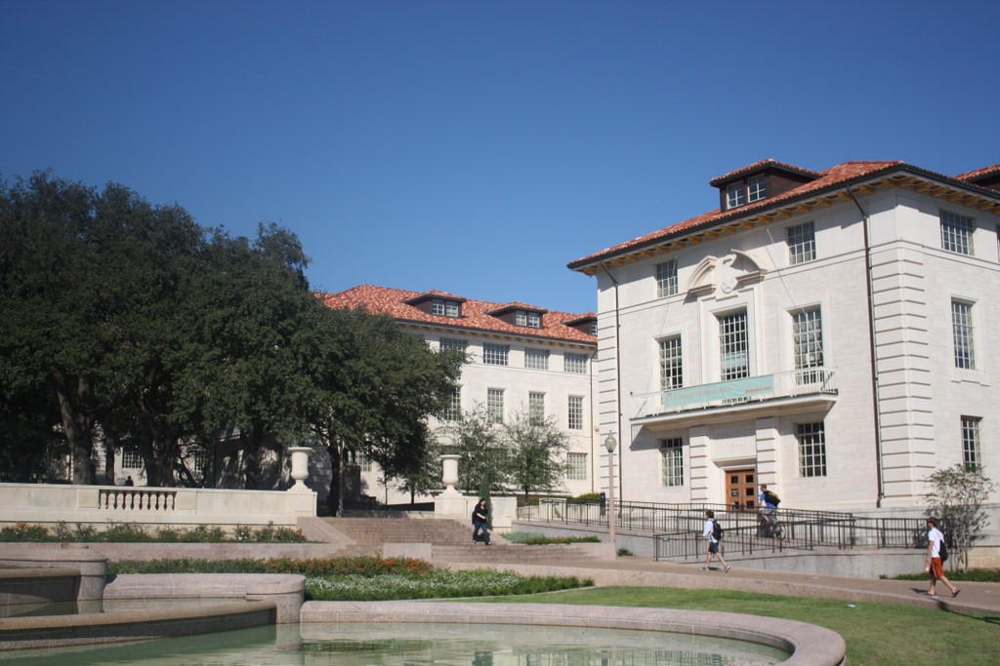

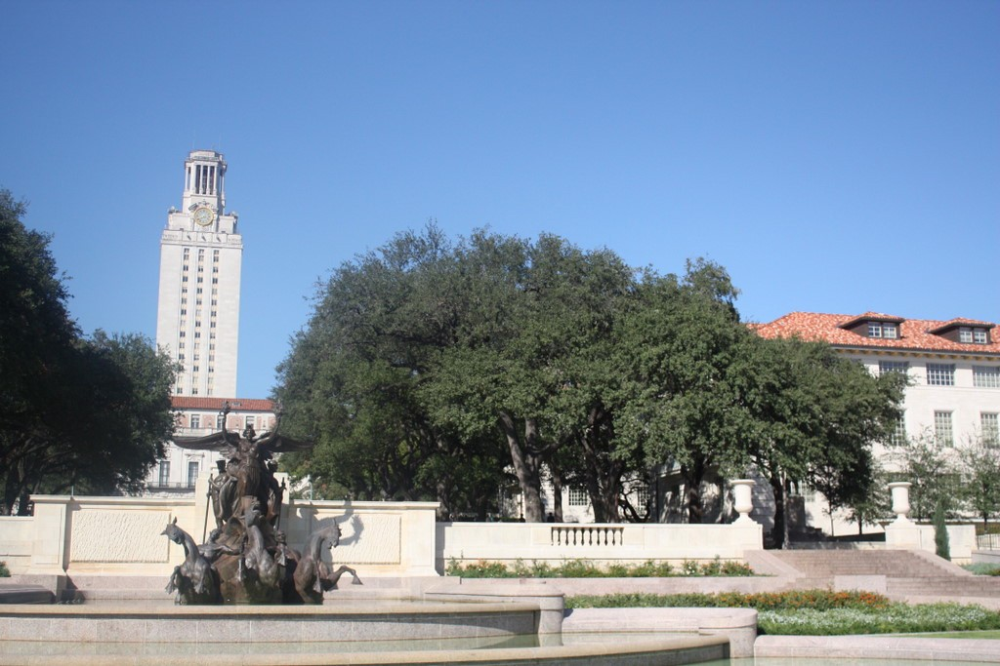

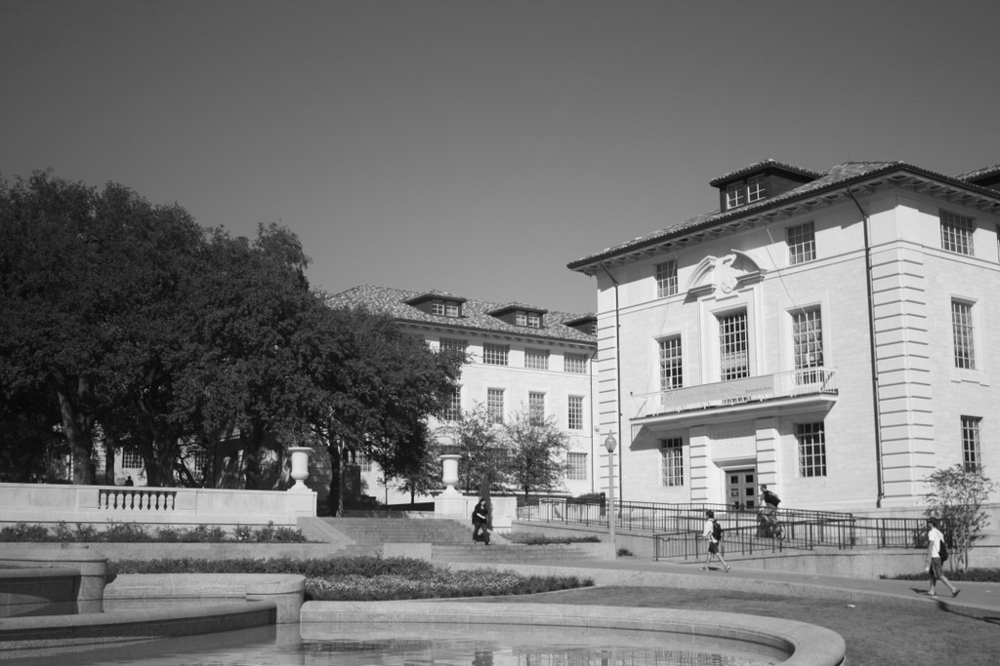

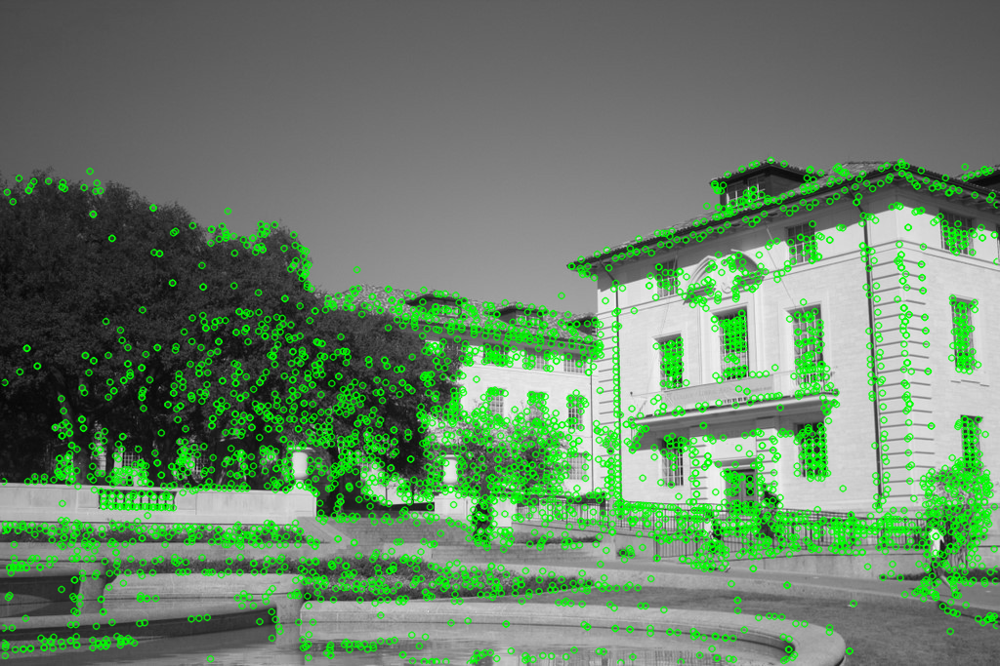

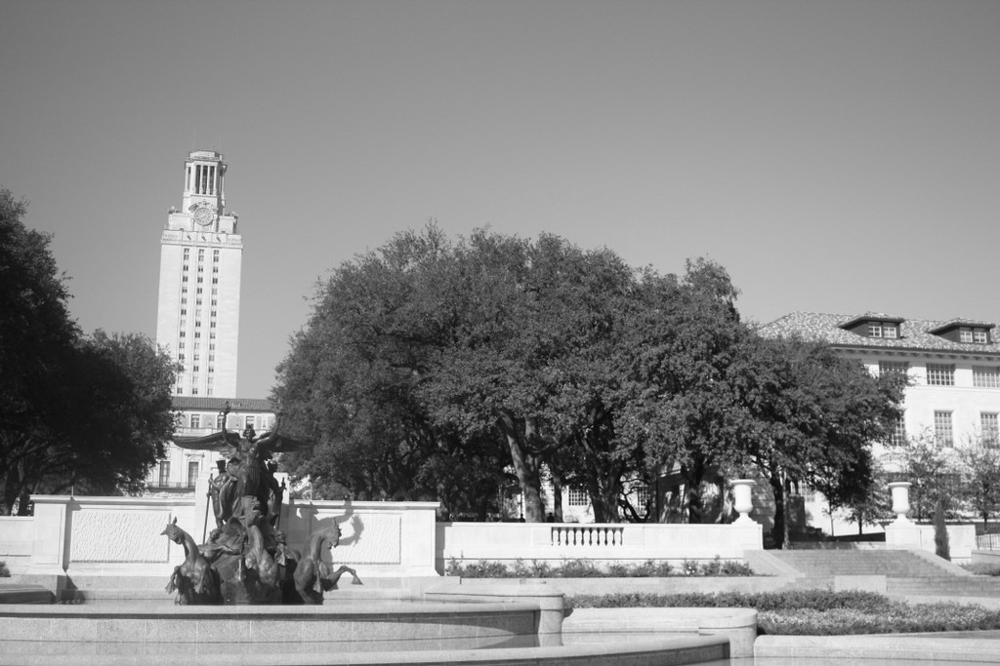

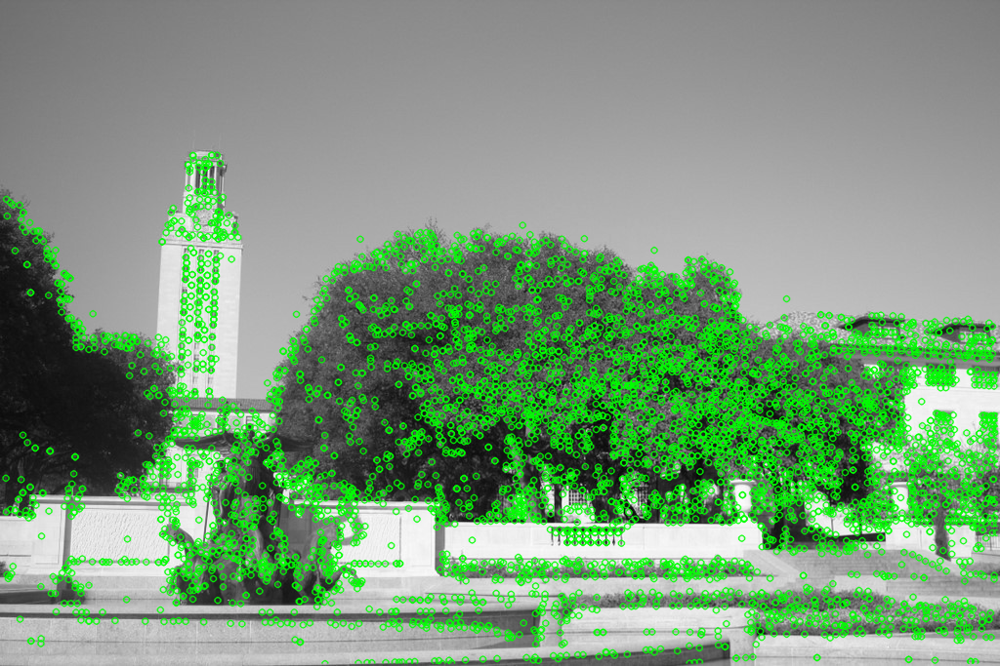

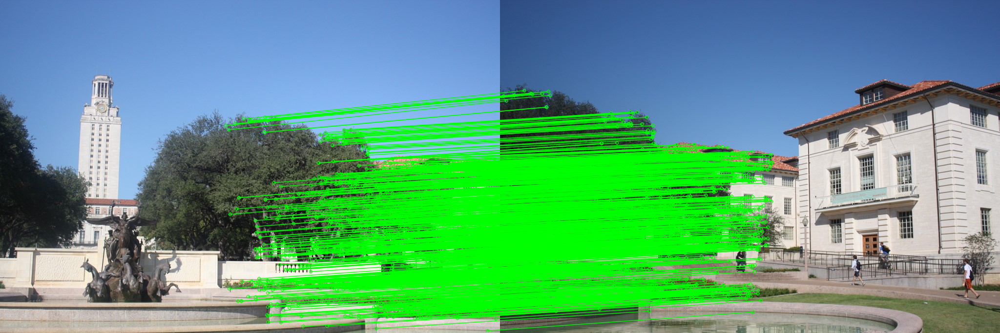

<class 'numpy.ndarray'>
using ransac


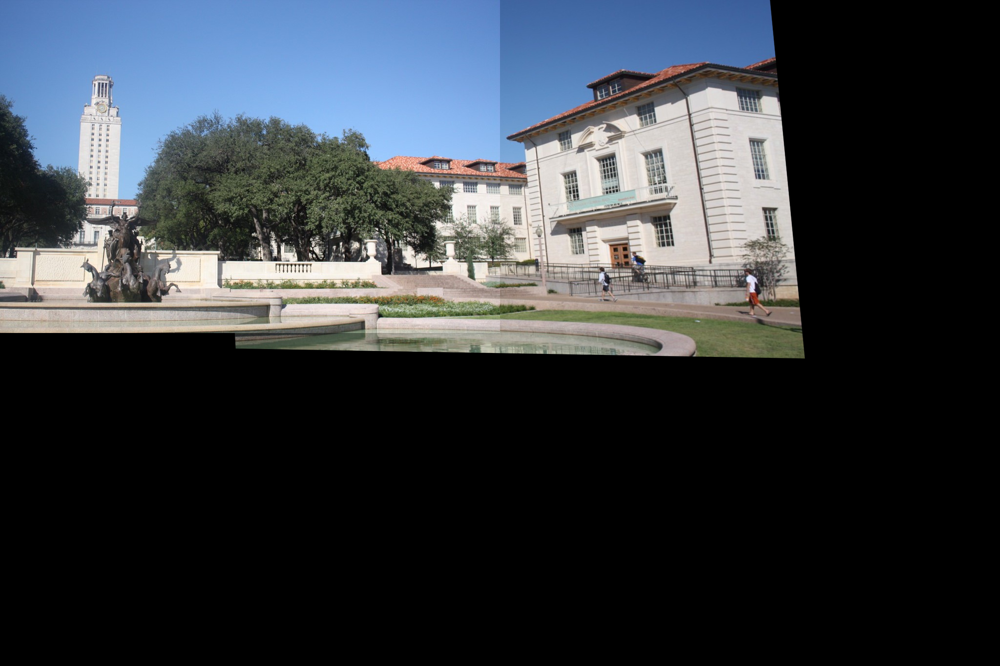

no ransac


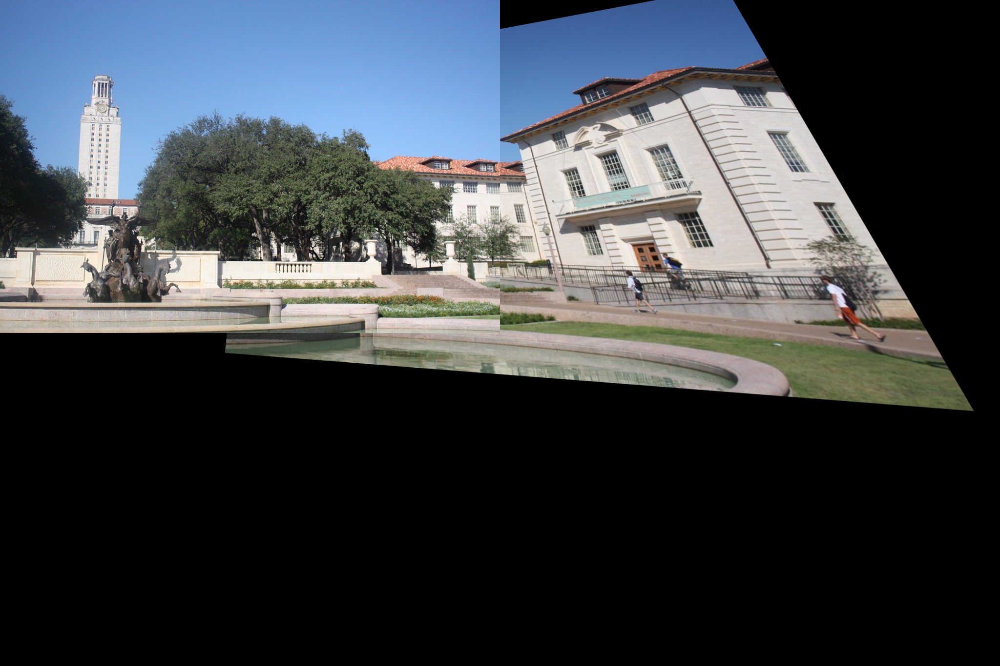

In [78]:
run_panorama('/content/Image_1_A.jpg','/content/Image_1_B.jpg',0.65)#run 1st example

##Example:2

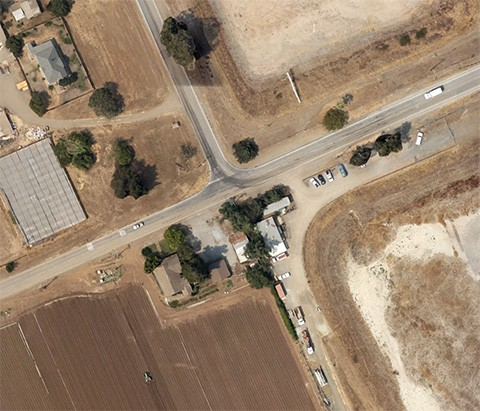

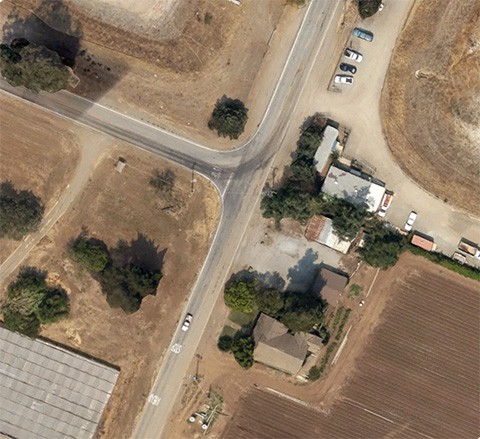

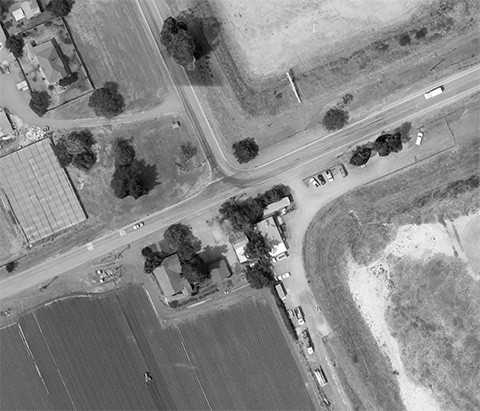

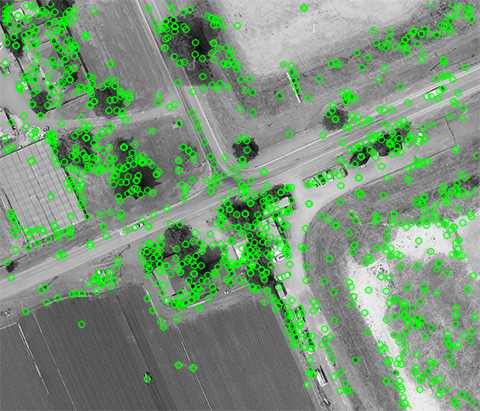

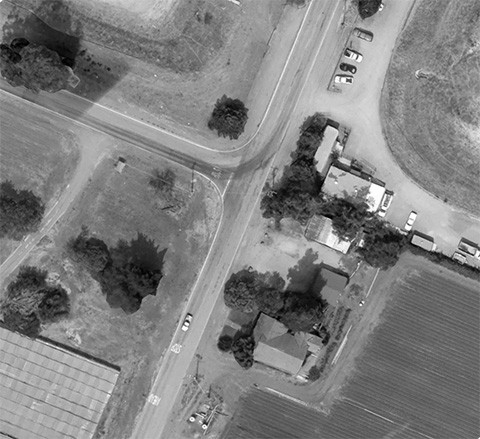

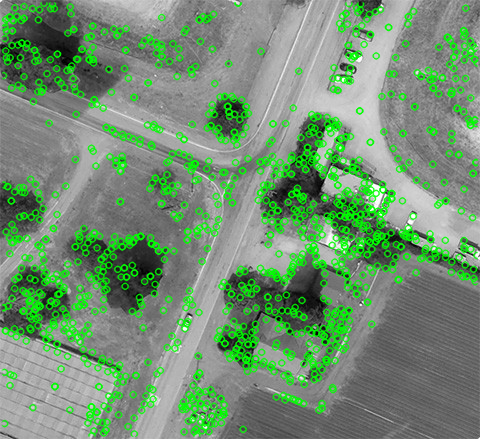

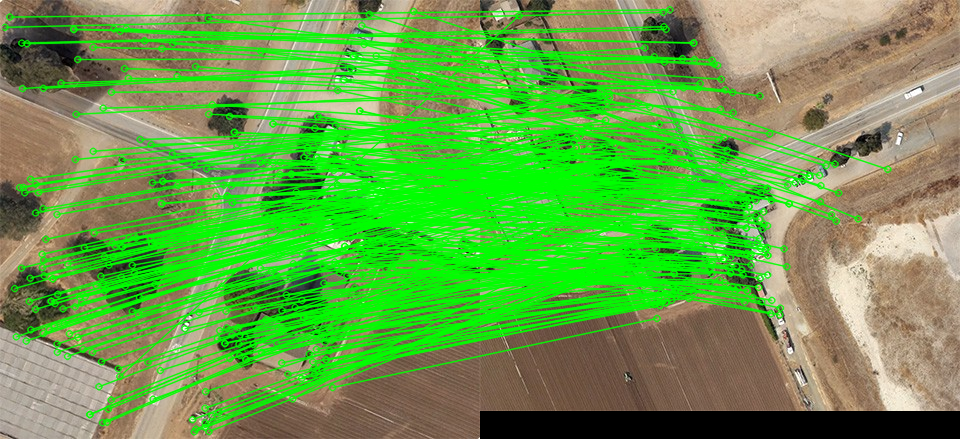

<class 'numpy.ndarray'>
using ransac


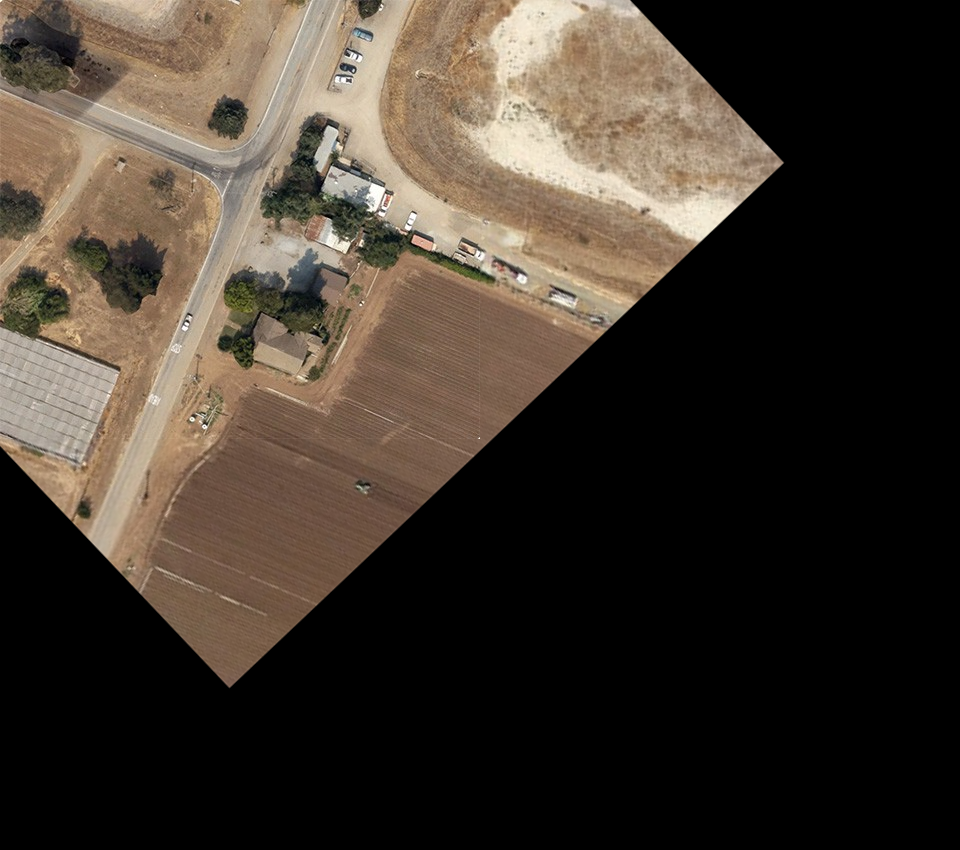

no ransac


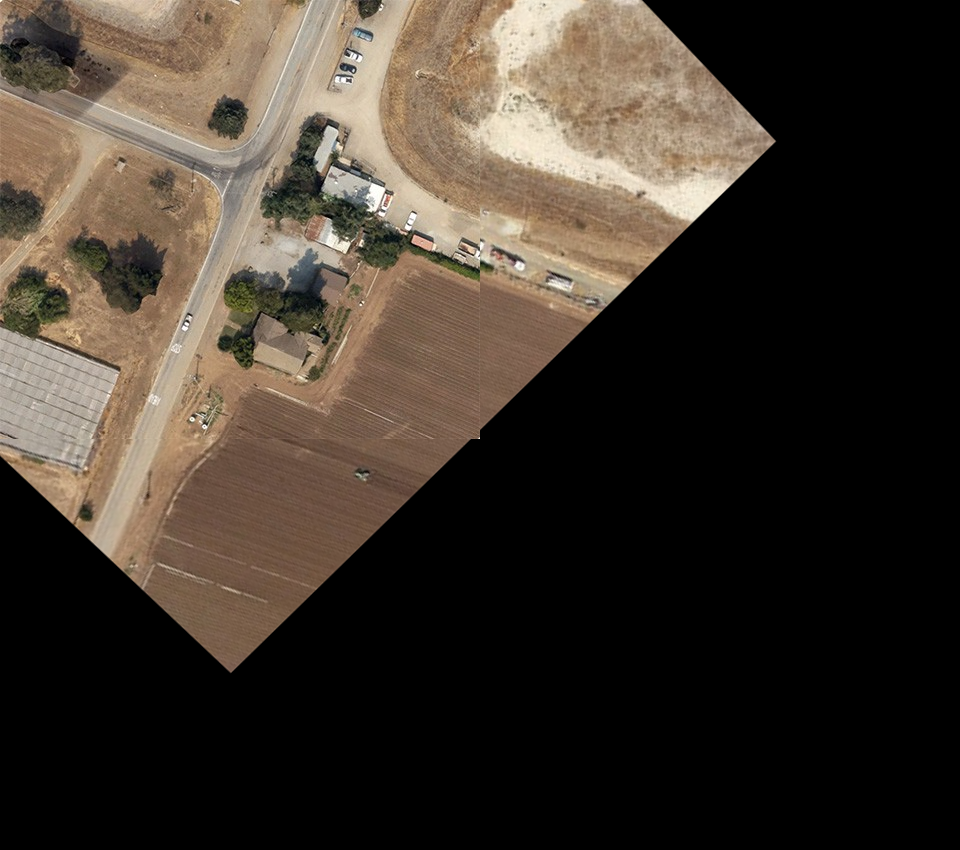

In [80]:
run_panorama('/content/ex_2_1.jpg','/content/ex_2_2.jpg',0.65)#run 2nd example